/Users/helge/anaconda/lib/python3.4/site-packages/IPython/kernel/__init__.py:13: ShimWarning: The `IPython.kernel` package has been deprecated. You should import from ipykernel or jupyter_client instead.
  "You should import from ipykernel or jupyter_client instead.", ShimWarning)



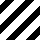
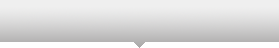
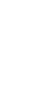
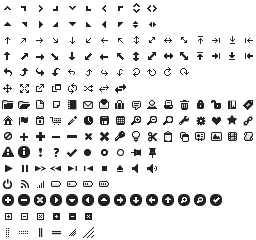
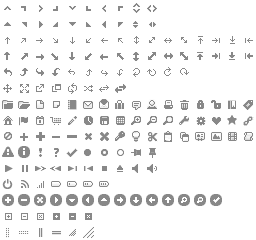
...
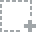
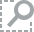
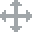
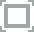
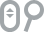

In [1]:
%matplotlib inline
import plyades as pl
import numpy as np
from scipy import optimize
from IPython.display import Image
from astropy.time import Time
import astropy.units as units
from bokeh.io import output_notebook
output_notebook()

# Definition of State Vectors

* $\vec{r} \in \mathbf{R}^3$: Position vector
* $\vec{v} \in \mathbf{R}^3$: Velocity vector
* $t$: Epoch e.g. in Julian days
* Coordinate frame
* Central body (e.g. gravitational parameter $\mu =GM$)

http://spaceflight.nasa.gov/realdata/sightings/SSapplications/Post/JavaSSOP/orbit/ISS/SVPOST.html

In [2]:
# Position and velocity vectors with AstroPy units
iss_r = np.array([
    -2775.03475,
    4524.24941,
    4207.43331,
    ]) * units.km
iss_v = np.array([
    -3.641793088,
    -5.665088604,
    3.679500667,
    ]) * units.km/units.s
# Use Time class from AstroPy
iss_t = Time('2015-08-28T12:00:00.000')
# Reference frame is Earth-Centered Intertial (ECI)
frame = 'ECI'
# Central body is Earth
body = pl.bodies.EARTH

iss = pl.State(iss_r, iss_v, iss_t, frame, body)
iss

# Determination of Keplerian Orbital Elements

* Shape of the orbital ellipse (or other conic section):
    * $a$: Semi-major axis
    * $e$: Eccentricity
* Orientation of the orbital plane:
    * $i$: Inclination
    * $\Omega$: Longitude of the ascending node
* Orientation of the orbital ellipse within the orbital plane:
    * $\omega$: Argument of periapsis
* Position of the orbiting body on the orbital ellipse at a given point in time:
    * $\nu$: True anomaly

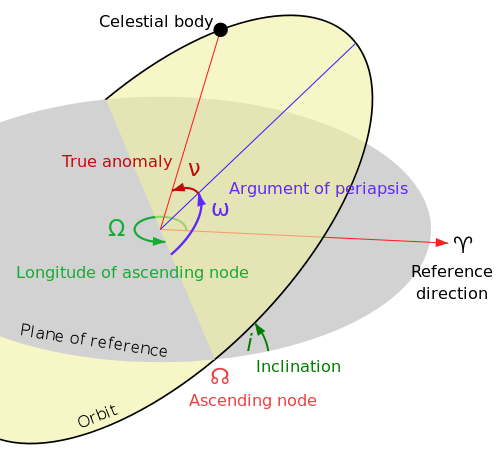

In [3]:
# Image source: https://en.wikipedia.org/wiki/Orbital_elements#/media/File:Orbit1.svg
Image('kepler.png', width=400)

# Inputs

* $\vec{r}$
* $\vec{v}$
* $\mu$

In [4]:
iss.pprint_elements()

<IPython.core.display.Latex object>

In [5]:
iss.semi_major_axis*(1+iss.eccentricity) - iss.body.mean_radius

<Quantity 414.18772325611553 km>

In [6]:
iss.period.to(units.minute)

<Quantity 92.55296179468472 min>

# Solving Kepler's Equation
Paraphrasing Kepler's Second Law:
> The radius vector sweeps equal areas in equal fractions of time.

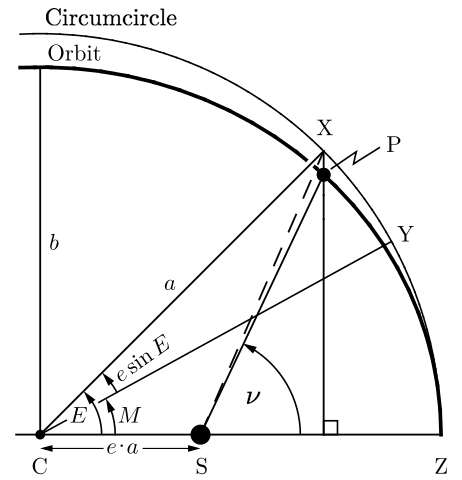

In [7]:
# Image based on: https://de.wikipedia.org/wiki/Kepler-Gleichung#/media/File:Kepler%27s_equation_scheme_German.svg
Image('kepler_eq.png', width=400)

* $M$: Mean anomaly - angle at the center sweeping the circumcircle of the orbit
* $E$: Eccentric anomaly - angle at the center sweeping the orbital ellipse
* $\nu$: True anomaly - angle at the focus sweeping the orbital ellipse


## Mean Anomaly and Mean Motion
$$M=n\Delta t+M_0~~\text{with}~~n = \sqrt{\frac{\mu}{a^3}} = \frac{2\pi}{T}$$

## Relationship between True Anomaly and Eccentric Anomaly
$$\tan \frac{\nu}{2} = \sqrt{\frac{1+e}{1-e}}\tan\frac{E}{2}$$

## Relationship between Mean Anomaly and Eccentric Anomaly: Kepler's Equation
$$ M=E - E\sin e$$


In [8]:
def mean2ecc(M, e):
    def kepler_eq(E):
        return E - e*np.sin(E) - M

    def kepler_eq_der(E):
        return 1 - e*np.cos(E)

    return optimize.newton(
        kepler_eq, M, kepler_eq_der, args=(), tol=1e-10, maxiter=50)

In [9]:
new_state = iss.kepler_state(1800*units.s)
new_state

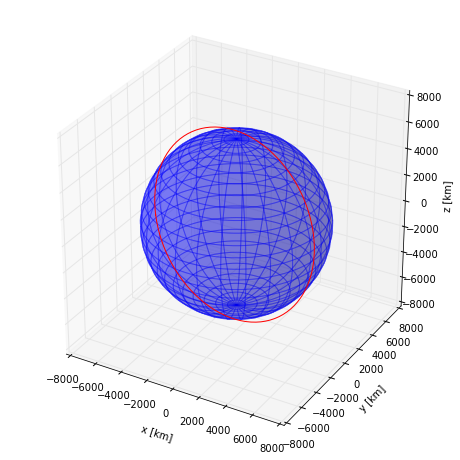

In [10]:
kepler_orbit = iss.kepler_orbit()
kepler_orbit.plot3d()

In [11]:
kepler_orbit.plot_plane(plane='XZ')

In [12]:
new_orbit = new_state.kepler_orbit()
new_orbit.plot_plane(plane='XZ')

# Numerical Propagation


## Newton's Equation
$$\ddot{\vec{r}}=-\mu\frac{\vec{r}}{r^3}+\vec{F_{1..n}}$$

## Additional Forces

* Third-body perturbations
* Atmospheric drag
* Solar-radiation pressure
* Non-uniform gravity potential

## Numerical Integration

* DOP853 (8th-order Runge-Kutta with Dormand-Prince coefficients)

In [13]:
newton_orbit = iss.propagate(iss.period*0.9, max_step=500, interpolate=200)
newton_orbit.plot_plane(plane='XZ', show_steps=True)

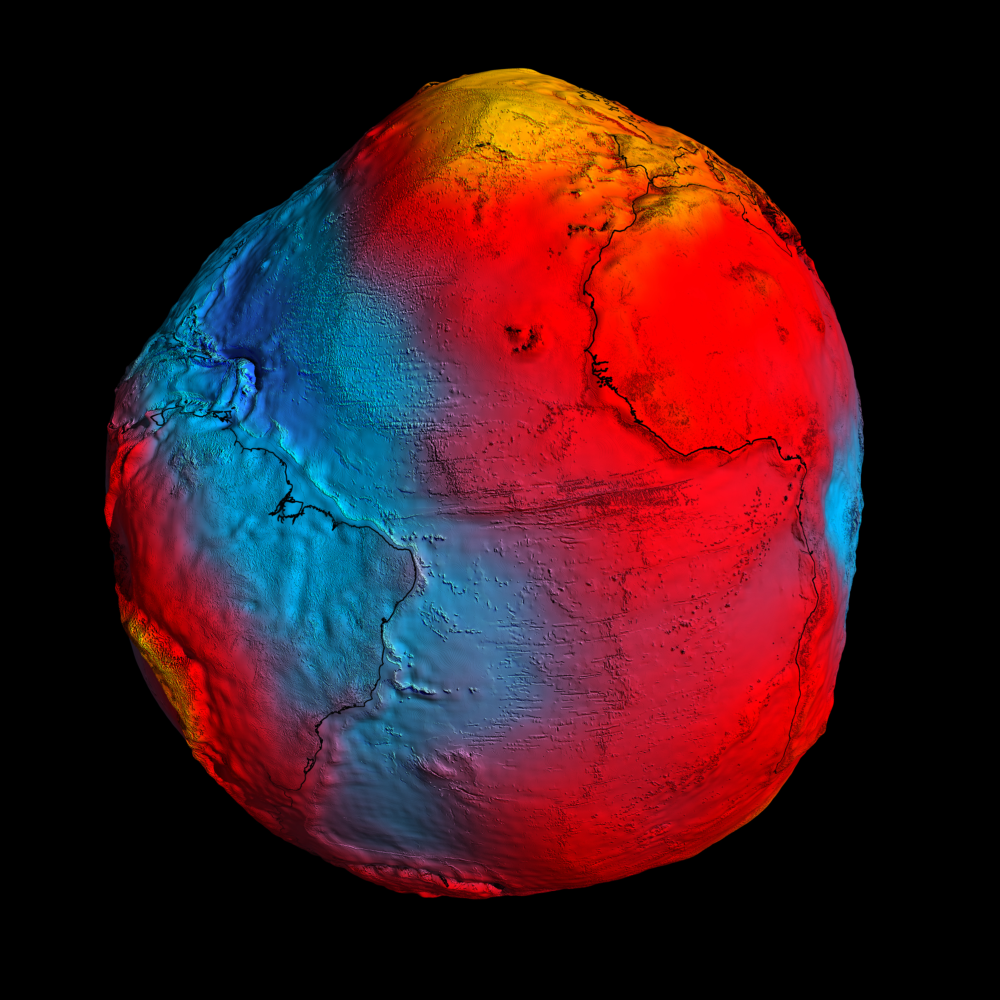

In [14]:
# Image source: http://www.esa.int/spaceinimages/Images/2011/03/New_GOCE_geoid
Image('goce.jpg', width=500)

In [15]:
@iss.gravity
def newton_j2(f, t, y, params):
    r = np.sqrt(np.square(y[:3]).sum())
    mu = params['body'].mu.value
    j2 = params['body'].j2
    r_m = params['body'].mean_radius.value
    rx, ry, rz = y[:3]
    f[:3] += y[3:]
    pj = -3/2*mu*j2*r_m**2/r**5
    f[3] += -mu*rx/r**3 + pj*rx*(1-5*rz**2/r**2)
    f[4] += -mu*ry/r**3 + pj*ry*(1-5*rz**2/r**2)
    f[5] += -mu*rz/r**3 + pj*rz*(3-5*rz**2/r**2)

In [16]:
j2_orbit = iss.propagate(iss.period*50, interpolate=3000)
j2_orbit.plot_plane(plane='XZ', show_steps=False)

In [17]:
j2_orbit.plot_element('ascending_node')